In [1]:
# import numpy and pandas
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

%config Completer.use_jedi=False
import os

#import sklearn for cross validation|
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.model_selection import KFold,cross_val_predict,cross_val_score,cross_validate

#import keras modules
import tensorflow as tf
from tensorflow import keras
import keras.backend as K
import keras.backend.tensorflow_backend as KTF
import keras
import keras.layers
from keras.layers import Layer 
import keras.initializers
from keras.models import Model, Sequential,load_model
from keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Embedding, Lambda, Flatten, Multiply, multiply,dot, add,subtract
from keras.layers import Concatenate,concatenate,LeakyReLU,maximum,minimum
from keras.optimizers import Adam
from keras.regularizers import l2,l1
from keras.preprocessing import sequence
from keras.engine.topology import Layer, InputSpec

from keras.utils import plot_model
from IPython.display import SVG


from sklearn.metrics import precision_recall_curve, auc, roc_curve

#import rdkit
import rdkit
import rdkit.Chem as Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Fingerprints import FingerprintMols

#fix the random seed
np.random.seed(5)

import pickle
import random

from urllib.request import urlopen


Using TensorFlow backend.


In [2]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By

import re

from time import sleep

In [212]:
study_address_list=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/cBioPortal_Studies_with_Treatment.csv',header=None)

In [269]:
def file_from_study(address):
    # create a new chrome session
    options = Options()
    options.add_argument('--headless')
    options.add_argument('--no-sandbox')
    driver = webdriver.Chrome(chrome_options=options, executable_path='/DAS_Storage4/ijjin/tmp/Chrome/chromedriver')
    driver.get(address)
    sleep(3)
    tmp=driver.page_source
    driver.close()
    body_part=re.split('<body',tmp)[1]
    
    try:    
        body_part_tmp=re.split('"',body_part)
        body_part_tmp_1=[x for x in body_part_tmp if 'cbioportal-datahub' in x]
        download_link=body_part_tmp_1[0]
    except IndexError:
        download_link=None
        
    try:
        body_part_tmp=re.split('<span data-test',body_part)
        body_part_tmp=[x for x in body_part_tmp if 'margin-bottom' in x]
        body_part_tmp=body_part_tmp[0]
        body_part_tmp2=re.split('>',body_part_tmp)
        study_name=body_part_tmp2[-1]
    except IndexError:
        study_name=None
        
    return [download_link,study_name]

In [270]:
download_link_list=[]
study_name_list=[]
for i in range(len(study_address_list)):
    address=study_address_list.iloc[i].values[0]
    print(str(i)+': '+address)
    value=file_from_study(address)
    download_link_list.append(value[0])
    study_name_list.append(value[1])

0: https://www.cbioportal.org/study/summary?id=mel_tsam_liang_2017
1: https://www.cbioportal.org/study/summary?id=acc_tcga_pan_can_atlas_2018
2: https://www.cbioportal.org/study/summary?id=blca_tcga_pan_can_atlas_2018
3: https://www.cbioportal.org/study/summary?id=lgg_tcga_pan_can_atlas_2018
4: https://www.cbioportal.org/study/summary?id=brca_hta9_htan_2022
5: https://www.cbioportal.org/study/summary?id=brca_tcga_pan_can_atlas_2018
6: https://www.cbioportal.org/study/summary?id=cesc_tcga_pan_can_atlas_2018
7: https://www.cbioportal.org/study/summary?id=pan_origimed_2020
8: https://www.cbioportal.org/study/summary?id=chol_tcga_pan_can_atlas_2018
9: https://www.cbioportal.org/study/summary?id=coadread_tcga_pan_can_atlas_2018
10: https://www.cbioportal.org/study/summary?id=dlbc_tcga_pan_can_atlas_2018
11: https://www.cbioportal.org/study/summary?id=esca_tcga_pan_can_atlas_2018
12: https://www.cbioportal.org/study/summary?id=egc_trap_msk_2020
13: https://www.cbioportal.org/study/summary?id

In [329]:
clinical_study_df=pd.DataFrame({'study_name':study_name_list,'study_link':study_address_list[0].values,'data_link':download_link_list})

In [330]:
clinical_study_df.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/cBioPortal_DataFrame.csv')

In [332]:
clinical_study_df_without_nan=clinical_study_df.dropna()

In [344]:
list_tmp=[re.split('[()]',x) for x in clinical_study_df_without_nan.study_name]
cancer_type=[x[0] for x in list_tmp]
cancer_type=[x[:-1] for x in cancer_type]
organization=[x[1] for x in list_tmp]
clinical_study_df_without_nan['cancer_type']=cancer_type
clinical_study_df_without_nan['organization']=organization
clinical_study_df_without_nan['identifier']=range(len(clinical_study_df_without_nan))

In [346]:
clinical_study_df_without_nan.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221026_cBioPortal_DataFrame_without_nan.csv')

In [3]:
from os import mkdir

In [4]:
clinical_study_df_without_nan=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221026_cBioPortal_DataFrame_without_nan.csv',index_col=0)

In [6]:
for idx,x in clinical_study_df_without_nan.iterrows():
    target_directory='/DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/'
    try:
        mkdir(target_directory)
    except FileExistsError:
        None
    os.system('wget '+x.data_link+' -P '+target_directory)

--2022-10-26 17:13:58--  https://cbioportal-datahub.s3.amazonaws.com/mel_tsam_liang_2017.tar.gz
Resolving cbioportal-datahub.s3.amazonaws.com (cbioportal-datahub.s3.amazonaws.com)... 3.5.2.131
Connecting to cbioportal-datahub.s3.amazonaws.com (cbioportal-datahub.s3.amazonaws.com)|3.5.2.131|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8344481 (8.0M) [application/x-tar]
Saving to: ‘/DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/mel_tsam_liang_2017.tar.gz’

     0K .......... .......... .......... .......... ..........  0%  127K 64s
    50K .......... .......... .......... .......... ..........  1%  253K 47s
   100K .......... .......... .......... .......... ..........  1%  127K 53s
   150K .......... .......... .......... .......... ..........  2%  208K 49s
   200K .......... .......... .......... .......... ..........  3%  143K 50s
   250K .......... .......... .......... .......... ..........  3%  200K 48s
   300K .......... .......... .......

In [10]:
from os import listdir
from os.path import isfile, join
mypath='/DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

for file in onlyfiles:
    os.system('tar -xzf '+mypath+file+' -C /DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/')

In [134]:
root='/DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/'
treatment_df_list=[]
for path, subdirs, files in os.walk(root):
    for name in files:
        if 'data_timeline_treatment' in name:
            study=path.split('/')[-1]
            treatment_df=pd.read_csv(os.path.join(path, name),delimiter='\t')
            treatment_df.columns=[str.lower(column) for column in treatment_df.columns]
            treatment_df['study']=study
            treatment_df=treatment_df[['study','patient_id','agent','treatment_type','start_date','stop_date']]
            treatment_df_list.append(treatment_df)
        #print(os.path.join(path, name))
treatment_df_total=pd.concat(treatment_df_list)

In [211]:
root='/DAS_Storage4/ijjin/Study_2/Clinical/221026_downloaded_data/'
clinical_df_list=[]
clinical_origin_list=[]
target_column=['study','patient identifier','cancer type']#,'cancer type detailed','tumor type','sample type','tumor disease anatomic site','primary tumor site','tissue site','tumor location']
for path, subdirs, files in os.walk(root):
    for name in files:
        if 'data_clinical_sample' in name:
            study=path.split('/')[-1]
            clinical_df=pd.read_csv(os.path.join(path, name),delimiter='\t')
            clinical_df=clinical_df.iloc[4:]
            clinical_df['study']=study
            clinical_df.columns=[str.lower(column) for column in clinical_df.columns]
            clinical_df.columns=[re.sub('[^A-Za-z0-9 ]+', '', column) for column in clinical_df.columns]
            clinical_origin_list.append(clinical_df)
            clinical_df_columns=clinical_df.columns
            clinical_df_columns=[x for x in clinical_df_columns if x in target_column]
            clinical_df=clinical_df[clinical_df_columns]
            clinical_df_list.append(clinical_df)

In [213]:
for idx,x in enumerate(clinical_df_list):
    if len(x.columns)==2:
        print(str(idx))

4
12
16


In [214]:
clinical_df_list[4]['cancer type']='Breast cancer'
clinical_df_list[12]['cancer type']=clinical_origin_list[12]['tissue site']
clinical_df_list[16]['cancer type']='Cholangiocarcinoma'

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [215]:
clinical_df_total=pd.concat(clinical_df_list)

In [228]:
clinical_df_total=clinical_df_total.dropna()
clinical_df_total=clinical_df_total.drop_duplicates(subset='patient identifier')
treatment_df_total=treatment_df_total.dropna()

In [229]:
clinical_df_total=clinical_df_total.reset_index(drop=True)
treatment_df_total=treatment_df_total.reset_index(drop=True)

In [299]:
clinical_df_total.columns=['patient_id','cancer_type','study']

In [301]:
treatment_with_cancer_type=pd.merge(left=treatment_df_total,right=clinical_df_total,on=['study','patient_id'],how='inner')

In [319]:
treatment_with_cancer_type.stop_date=treatment_with_cancer_type.stop_date.astype('int')

In [320]:
treatment_with_cancer_type.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221027_Treatment_with_Cancer_type.csv')

In [321]:
treatment_with_cancer_type

,study,patient_id,agent,treatment_type,start_date,stop_date,cancer_type
0,mel_tsam_liang_2017,P-2,Ipilimumab,Medical Therapy,1547,1548,Melanoma
1,mel_tsam_liang_2017,P-2,Vem/cobi,Medical Therapy,1198,1478,Melanoma
2,mel_tsam_liang_2017,P-4,Ipilimumab,Medical Therapy,862,1010,Melanoma
3,mel_tsam_liang_2017,P-4,Nivolumab,Medical Therapy,508,606,Melanoma
4,mel_tsam_liang_2017,P-5,Ipilimumab,Medical Therapy,404,579,Melanoma
...,...,...,...,...,...,...,...
15427,uvm_tcga_pan_can_atlas_2018,TCGA-V4-A9ET,Fotemustine,Chemotherapy,21,174,Ocular Melanoma
15428,uvm_tcga_pan_can_atlas_2018,TCGA-V4-A9F1,Fotemustine,Chemotherapy,22,147,Ocular Melanoma
15429,uvm_tcga_pan_can_atlas_2018,TCGA-V4-A9F3,Fotemustine,Chemotherapy,27,175,Ocular Melanoma
15430,uvm_tcga_pan_can_atlas_2018,TCGA-WC-A87Y,Radiation 1,Radiation Therapy,22,64,Ocular Melanoma


In [322]:
treatment_count_by_patient=treatment_with_cancer_type.groupby(by=['study','patient_id']).count()[['agent']]
treatment_count_by_patient.columns=['count']
treatment_count_by_patient=treatment_count_by_patient.reset_index()

In [323]:
treatment_with_count=pd.merge(treatment_with_cancer_type,treatment_count_by_patient,on=['study','patient_id'],how='left')

In [324]:
treatment_with_count_comb=treatment_with_count[treatment_with_count['count']>1]

In [326]:
def overlap(start1,end1,start2,end2):
    latest_start=max(start1,start2)
    earliest_end=min(end1,end2)
    delta=earliest_end-latest_start+1
    overlap=max(0,delta)
    return overlap

In [358]:
import itertools
def extract_combination(df):
    if len(df)<2:
        return None
    else:
        row_list=[]
        for idx,x in df.iterrows():
            row_list.append(x)
        combination_candidate_list=list(itertools.combinations(row_list,2))
        combination_list=[]
        for combination in combination_candidate_list:
            overlap_duration=overlap(combination[0].start_date,combination[0].stop_date,combination[1].start_date,combination[1].stop_date)
            #overlap_duration=overlap(combination[0].start_date.values,treatment1.stop_date.values,treatment2.start_date.values,treatment2.stop_date.values)
            if overlap_duration>0:
                combination_list.append([combination[0].agent,combination[1].agent])
        return combination_list

In [397]:
patient_df=treatment_with_count_comb[['study','patient_id','cancer_type','count']].drop_duplicates()

In [402]:
patient_df=patient_df[['study','patient_id','cancer_type']]

In [407]:
patient_df['combination']=None

In [414]:
for idx,x in patient_df.iterrows():
    df_treatment=treatment_with_count_comb[treatment_with_count_comb.patient_id==x.patient_id]
    patient_df.at[idx,'combination']=extract_combination(df_treatment)

In [418]:
patient_df_with_combination=patient_df[[(len(x.combination)>0) for idx,x in patient_df.iterrows()]]

In [420]:
patient_df_with_combination.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221028_Patient_with_combination.csv')

In [430]:
treatment_drug_only=treatment_with_count_comb[treatment_with_count.treatment_type!='Radiation Therapy']

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


In [445]:
treatment_drug_only=treatment_drug_only[['study','patient_id','agent','treatment_type','start_date','stop_date','cancer_type']]
count_df=treatment_drug_only.groupby(by=['study','patient_id','cancer_type']).count()[['agent']]
count_df=count_df.reset_index()
count_df.columns=['study','patient_id','cancer_type','count']
treatment_drug_only_with_count=pd.merge(treatment_drug_only,count_df,on=['study','patient_id','cancer_type'],how='left')

In [448]:
treatment_drug_only_with_count=treatment_drug_only_with_count[treatment_drug_only_with_count['count']>1]

In [450]:
patient_df_drug_only=treatment_drug_only_with_count[['study','patient_id','cancer_type']].drop_duplicates()

In [451]:
patient_df_drug_only['combination']=None

In [453]:
for idx,x in patient_df_drug_only.iterrows():
    df_treatment=treatment_drug_only_with_count[treatment_drug_only_with_count.patient_id==x.patient_id]
    patient_df_drug_only.at[idx,'combination']=extract_combination(df_treatment)


In [455]:
patient_df_with_drug_combination=patient_df_drug_only[[(len(x.combination)>0) for idx,x in patient_df_drug_only.iterrows()]]

In [457]:
patient_df_with_drug_combination.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221028_Patient_with_drug_combination.csv')

In [477]:
patient_df_with_drug_combination=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221028_Patient_with_drug_combination.csv',index_col=0)

In [479]:
patient_df_with_drug_combination.cancer_type=[str.lower(x) for x in patient_df_with_drug_combination.cancer_type]

In [480]:
cancer_type_list=list(set(patient_df_with_drug_combination.cancer_type))

In [505]:
from ast import literal_eval
patient_df_with_drug_combination.combination=[literal_eval(string) for string in patient_df_with_drug_combination.combination]

In [508]:
def list2sorted_list(list_of_list):
    sorted_list=[]
    for list_element in list_of_list:
        sorted_list.append(np.sort(list_element))
    return sorted_list

In [509]:
patient_df_with_drug_combination['combination']=[list2sorted_list(x) for x in patient_df_with_drug_combination.combination]

In [510]:
patient_df_with_drug_combination

,study,patient_id,cancer_type,combination
16,mel_tsam_liang_2017,P-17,melanoma,"[[Ipilimumab, MK-3475]]"
21,mel_tsam_liang_2017,P-20,melanoma,"[[Ipilimumab, Vem + ipi]]"
23,mel_tsam_liang_2017,P-25,melanoma,"[[Ipilimumab, Vem]]"
29,acc_tcga_pan_can_atlas_2018,TCGA-OR-A5JM,adrenocortical carcinoma,"[[Ketoconazole, Sunitinib]]"
32,acc_tcga_pan_can_atlas_2018,TCGA-OR-A5K2,adrenocortical carcinoma,"[[Cisplatin, Doxorubicin], [Carboplatin, Doxor..."
...,...,...,...,...
11640,ucec_tcga_pan_can_atlas_2018,TCGA-JU-AAVI,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11643,ucec_tcga_pan_can_atlas_2018,TCGA-K6-A3WQ,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11646,ucec_tcga_pan_can_atlas_2018,TCGA-QF-A5YS,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11649,ucec_tcga_pan_can_atlas_2018,TCGA-QS-A5YQ,endometrial cancer,"[[Carboplatin, Paclitaxel]]"


In [514]:
cancer_type_list

['ovarian epithelial tumor',
 'thymic epithelial tumor',
 'glioblastoma',
 'hepatobiliary cancer',
 'esophagogastric cancer',
 'cholangiocarcinoma',
 'pleural mesothelioma',
 'sarcoma',
 'bladder cancer',
 'non-seminomatous germ cell tumor',
 'breast cancer',
 'renal non-clear cell carcinoma',
 'adrenocortical carcinoma',
 'non-small cell lung cancer',
 'small cell lung cancer',
 'colorectal cancer',
 'prostate cancer',
 'mature b-cell neoplasms',
 'pheochromocytoma',
 'seminoma',
 'renal clear cell carcinoma',
 'cervical cancer',
 'glioma',
 'endometrial cancer',
 'pancreatic cancer',
 'melanoma']

In [547]:
total_dic={}
for cancer_type in cancer_type_list:
    print(cancer_type)
    dic_tmp={}
    df_target=patient_df_with_drug_combination[patient_df_with_drug_combination.cancer_type==cancer_type]
    for idx,x in df_target.iterrows():
        for combination in x.combination:
            combination=tuple(combination)
            if combination in dic_tmp.keys():
                dic_tmp[combination]+=1
            else:
                dic_tmp[combination]=1
    df_tmp=pd.DataFrame.from_dict(dic_tmp,orient='index',columns=['count'])
    df_tmp=df_tmp.sort_values(by='count',ascending=False)
    total_dic[cancer_type]=df_tmp

ovarian epithelial tumor
thymic epithelial tumor
glioblastoma
hepatobiliary cancer
esophagogastric cancer
cholangiocarcinoma
pleural mesothelioma
sarcoma
bladder cancer
non-seminomatous germ cell tumor
breast cancer
renal non-clear cell carcinoma
adrenocortical carcinoma
non-small cell lung cancer
small cell lung cancer
colorectal cancer
prostate cancer
mature b-cell neoplasms
pheochromocytoma
seminoma
renal clear cell carcinoma
cervical cancer
glioma
endometrial cancer
pancreatic cancer
melanoma


In [555]:
total_dic.keys()

dict_keys(['ovarian epithelial tumor', 'thymic epithelial tumor', 'glioblastoma', 'hepatobiliary cancer', 'esophagogastric cancer', 'cholangiocarcinoma', 'pleural mesothelioma', 'sarcoma', 'bladder cancer', 'non-seminomatous germ cell tumor', 'breast cancer', 'renal non-clear cell carcinoma', 'adrenocortical carcinoma', 'non-small cell lung cancer', 'small cell lung cancer', 'colorectal cancer', 'prostate cancer', 'mature b-cell neoplasms', 'pheochromocytoma', 'seminoma', 'renal clear cell carcinoma', 'cervical cancer', 'glioma', 'endometrial cancer', 'pancreatic cancer', 'melanoma'])

In [563]:
for key in total_dic.keys():
    print(key+': '+str(len(total_dic[key])))
    print('# of patients: '+str(len(set(patient_df_with_drug_combination[patient_df_with_drug_combination.cancer_type==key].patient_id))))
    print('Max: '+str(total_dic[key]['count'].max()))
    print('Mean: '+str(total_dic[key]['count'].mean()))
    print('Median: '+str(total_dic[key]['count'].median()))
    print('-----------------')

ovarian epithelial tumor: 104
# of patients: 446
Max: 444
Mean: 11.125
Median: 2.0
-----------------
thymic epithelial tumor: 1
# of patients: 3
Max: 3
Mean: 3.0
Median: 3.0
-----------------
glioblastoma: 196
# of patients: 169
Max: 54
Mean: 3.63265306122449
Median: 1.0
-----------------
hepatobiliary cancer: 7
# of patients: 6
Max: 1
Mean: 1.0
Median: 1.0
-----------------
esophagogastric cancer: 57
# of patients: 122
Max: 52
Mean: 6.245614035087719
Median: 2.0
-----------------
cholangiocarcinoma: 2
# of patients: 4
Max: 3
Mean: 2.0
Median: 2.0
-----------------
pleural mesothelioma: 22
# of patients: 34
Max: 24
Mean: 2.6363636363636362
Median: 1.0
-----------------
sarcoma: 22
# of patients: 43
Max: 33
Mean: 3.0454545454545454
Median: 1.0
-----------------
bladder cancer: 37
# of patients: 94
Max: 59
Mean: 5.27027027027027
Median: 1.0
-----------------
non-seminomatous germ cell tumor: 6
# of patients: 37
Max: 35
Mean: 17.833333333333332
Median: 17.5
-----------------
breast cancer

In [562]:
patient_df_with_drug_combination

,study,patient_id,cancer_type,combination
16,mel_tsam_liang_2017,P-17,melanoma,"[[Ipilimumab, MK-3475]]"
21,mel_tsam_liang_2017,P-20,melanoma,"[[Ipilimumab, Vem + ipi]]"
23,mel_tsam_liang_2017,P-25,melanoma,"[[Ipilimumab, Vem]]"
29,acc_tcga_pan_can_atlas_2018,TCGA-OR-A5JM,adrenocortical carcinoma,"[[Ketoconazole, Sunitinib]]"
32,acc_tcga_pan_can_atlas_2018,TCGA-OR-A5K2,adrenocortical carcinoma,"[[Cisplatin, Doxorubicin], [Carboplatin, Doxor..."
...,...,...,...,...
11640,ucec_tcga_pan_can_atlas_2018,TCGA-JU-AAVI,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11643,ucec_tcga_pan_can_atlas_2018,TCGA-K6-A3WQ,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11646,ucec_tcga_pan_can_atlas_2018,TCGA-QF-A5YS,endometrial cancer,"[[Carboplatin, Paclitaxel]]"
11649,ucec_tcga_pan_can_atlas_2018,TCGA-QS-A5YQ,endometrial cancer,"[[Carboplatin, Paclitaxel]]"


In [550]:
for key in total_dic.keys():
    total_dic[key].to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221028_Combination_for_cancer_type/'+key+'.csv')

In [52]:
from os import listdir
from os.path import isfile, join
mypath='/DAS_Storage4/ijjin/Study_2/Clinical/221028_Combination_for_cancer_type/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
cancer_types=[filename.split('.')[0] for filename in onlyfiles]

total_dic={}
for cancer_type in cancer_types:
    total_dic[cancer_type]=pd.read_csv(mypath+cancer_type+'.csv',index_col=0)

In [53]:
import ast
for key in total_dic.keys():
    total_dic[key].index=[ast.literal_eval(x) for x in total_dic[key].index]

In [228]:
drug_list=[]
for key in total_dic.keys():
    combination_list=list(total_dic[key].index[:5])
    for drug_combination in combination_list:
        drug_list.extend(drug_combination)

In [229]:
drug_list=list(set(drug_list))

In [230]:
drug_list=[x.strip() for x in drug_list]

In [231]:
drug_is_combination=['+' in drug for drug in drug_list]
drug_is_not_combination=[not(boolean) for boolean in drug_is_combination]

In [232]:
from itertools import compress
drug_list_without_combination=list(compress(drug_list, drug_is_not_combination))

In [233]:
drug_list_without_combination=[x.capitalize() for x in drug_list_without_combination]

In [92]:
suppl = Chem.SDMolSupplier('/DAS_Storage4/ijjin/Study_2/Drug/NCI60_compound.sdf')
mols=[x for x in suppl]

[16:11:48] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:11:48] ERROR: Could not sanitize molecule ending on line 736
[16:11:48] ERROR: Explicit valence for atom # 4 O, 3, is greater than permitted
[16:11:48] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:11:48] ERROR: Could not sanitize molecule ending on line 25006
[16:11:48] ERROR: Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:11:48] Explicit valence for atom # 0 O, 3, is greater than permitted
[16:11:48] ERROR: Could not sanitize molecule ending on line 27712
[16:11:48] ERROR: Explicit valence for atom # 0 O, 3, is greater than permitted
[16:11:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:11:48] ERROR: Could not sanitize molecule ending on line 34694
[16:11:48] ERROR: Explicit valence for atom # 1 O, 3, is greater than permitted
[16:11:48] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:11:48] ERROR: Could not sanitize molecule e

In [121]:
list_prop=[]
for mol in mols_without_None:
    list_prop.extend(list(mol.GetPropNames()))

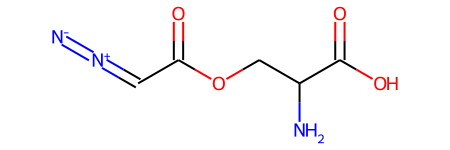

In [127]:
mols_with_USAN[0]

In [157]:
mols_without_None=[x for x in mols if x!=None ]
mols_with_USAN=[mol for mol in mols_without_None if 'dtpname:USAN' in mol.GetPropNames()]
Mol_df=pd.DataFrame({'Mol':mols_with_USAN,'Name':[x.GetProp('dtpname:USAN') for x in mols_with_USAN],'SMILES':[Chem.MolToSmiles(mol) for mol in mols_with_USAN]})
Mol_df.Name=[x.split('(')[0] for x in Mol_df.Name]
Mol_df.Name=[x.strip() for x in Mol_df.Name]

In [161]:
Mol_df_compact=Mol_df[['SMILES']]
Mol_df_compact.index=Mol_df.Name

In [246]:
drug_isin_NSC=[x in Mol_df_compact.index for x in drug_list_without_combination]
drug_not_isin_NSC=[not(x) for x in drug_isin_NSC]
drug_in_NSC=list(compress(drug_list_without_combination, drug_isin_NSC))
drug_not_in_NSC=list(compress(drug_list_without_combination, drug_not_isin_NSC))

drug_df_in_NSC=Mol_df_compact.loc[drug_in_NSC]
drug_df_in_NSC=drug_df_in_NSC.drop_duplicates()
drug_df_not_in_NSC=pd.DataFrame(index=drug_not_in_NSC)
drug_df_not_in_NSC['SMILES']=None

drug_df=pd.concat([drug_df_in_NSC,drug_df_not_in_NSC],axis=0)
drug_df=drug_df.reset_index()
drug_df=drug_df.drop_duplicates(subset=['index'])
drug_df.index=drug_df['index']
drug_df=drug_df[['SMILES']]

In [247]:
drug_df.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221122_top5_drugs_in_clinical_df_not_complete.csv')

In [248]:
drug_df=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221122_top5_drugs_in_clinical_df.csv',index_col=0)

In [250]:
drug_df['Mol']=[Chem.MolFromSmiles(smiles) for smiles in drug_df.SMILES]

In [257]:
drug_df['fingerprint']=[AllChem.GetMorganFingerprintAsBitVect(mol,2,nBits=512) for mol in drug_df.Mol]
compound_morgan512=pd.DataFrame([list(x) for x in drug_df.fingerprint.values])
compound_morgan512.index=drug_df.index
compound_morgan512.index=[x.capitalize() for x in compound_morgan512.index]

In [260]:
valid_drug_list=list(drug_df.index)

In [392]:
compound_morgan512.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_Morgan512_drug_in_clinical.csv')

In [316]:
top5_dic={}
for key in total_dic.keys():
    df_tmp=total_dic[key].iloc[:5]
    combination_list=list(df_tmp.index)
    combination_list=[list(x) for x in combination_list]
    df_tmp=pd.DataFrame(combination_list)
    df_tmp.columns=['Drug1','Drug2']
    df_tmp['Cancer_type']=key.capitalize()
    
    top5_dic[key.capitalize()]=df_tmp

In [318]:
cancer_types=list(top5_dic.keys())

In [319]:
cancer_types

['Ovarian epithelial tumor',
 'Thymic epithelial tumor',
 'Glioblastoma',
 'Hepatobiliary cancer',
 'Esophagogastric cancer',
 'Cholangiocarcinoma',
 'Pleural mesothelioma',
 'Sarcoma',
 'Bladder cancer',
 'Non-seminomatous germ cell tumor',
 'Breast cancer',
 'Renal non-clear cell carcinoma',
 'Adrenocortical carcinoma',
 'Non-small cell lung cancer',
 'Small cell lung cancer',
 'Colorectal cancer',
 'Prostate cancer',
 'Mature b-cell neoplasms',
 'Pheochromocytoma',
 'Seminoma',
 'Renal clear cell carcinoma',
 'Cervical cancer',
 'Glioma',
 'Endometrial cancer',
 'Pancreatic cancer',
 'Melanoma']

In [361]:
cellline_df=pd.read_table('/DAS_Storage4/ijjin/Study_2/220921_Final/CellLine/sample_info.csv',sep=',')
cellline_df.CCLE_Name=cellline_df.CCLE_Name.astype(str)
cellline_df['CCLE_Name']=[x.split('_')[0] for x in cellline_df['CCLE_Name']]

cellline_annotation_df=cellline_df[['CCLE_Name','Cellosaurus_NCIt_disease']]
cellline_annotation_df=cellline_annotation_df.dropna()
cellline_annotation_df.columns=['CCLE_CellName','CancerType']

In [362]:
Clinical2CCLE_list=[None,'Bladder carcinoma','Breast carcinoma','Cervical carcinoma','Cholangiocarcinoma','Colorectal carcinoma','Endometrial carcinoma',None,'Glioblastoma',None,None,None,'Melanoma',None,'Lung non-small cell carcinoma','Ovarian carcinoma','Pancreatic carcinoma',None,None,'Prostate carcinoma','Renal cell carcinoma','Renal cell carcinoma',None,None,'Lung small cell carcinoma',None]

In [363]:
Clinic2CCLE_df=pd.DataFrame({'Clinical':list(np.sort(cancer_types)),'CCLE':Clinical2CCLE_list})
Clinic2CCLE_df_valid=Clinic2CCLE_df.dropna()
Clinic2CCLE_df_valid=Clinic2CCLE_df_valid.reset_index(drop=True)

In [364]:
Clinic2CCLE_df_valid

,Clinical,CCLE
0,Bladder cancer,Bladder carcinoma
1,Breast cancer,Breast carcinoma
2,Cervical cancer,Cervical carcinoma
3,Cholangiocarcinoma,Cholangiocarcinoma
4,Colorectal cancer,Colorectal carcinoma
5,Endometrial cancer,Endometrial carcinoma
6,Glioblastoma,Glioblastoma
7,Melanoma,Melanoma
8,Non-small cell lung cancer,Lung non-small cell carcinoma
9,Ovarian epithelial tumor,Ovarian carcinoma


In [340]:
GeneExpression_with_Symbol=pd.read_csv('/DAS_Storage4/ijjin/Study_2/CellLine/CCLE_expression_zscore.csv',index_col=0)
CellLine_list=list(GeneExpression_with_Symbol.index)

In [365]:
CCLE_in_Clinical=cellline_annotation_df[cellline_annotation_df.CancerType.isin(Clinic2CCLE_df_valid.CCLE)]

In [367]:
CellLine_in_Clinical=CCLE_in_Clinical[CCLE_in_Clinical.CCLE_CellName.isin(CellLine_list)]

In [369]:
CCLE_in_Clinical[~CCLE_in_Clinical.CCLE_CellName.isin(CellLine_list)].sort_values(by='CCLE_CellName').to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_CCLE_not_matched_to_CellLine_list.csv')

In [370]:
CellLine_in_Clinical

,CCLE_CellName,CancerType
3,HS895T,Melanoma
29,NCIH1618,Lung small cell carcinoma
30,HS839T,Melanoma
32,HS934T,Melanoma
33,PK59,Pancreatic carcinoma
...,...,...
1269,LNCAPCLONEFGC,Prostate carcinoma
1270,EN,Endometrial carcinoma
1271,DU145,Prostate carcinoma
1288,HEC251,Endometrial carcinoma


In [385]:
top5_combination_df_list=[]
for key in top5_dic:
    top5_combination_df_list.append(top5_dic[key])
combination_df=pd.concat(top5_combination_df_list,axis=0)
combination_df.columns=['Drug1','Drug2','CancerType_Clinical']
combination_df=pd.merge(combination_df,Clinic2CCLE_df,how='inner',left_on='CancerType_Clinical',right_on='Clinical')[['Drug1','Drug2','CCLE']]
combination_df.columns=['Drug1','Drug2','CancerType']

In [423]:
combination_df=combination_df[(combination_df.Drug1.isin(compound_morgan512.index))&(combination_df.Drug2.isin(compound_morgan512.index))]

In [424]:
combination_df_with_cellline=pd.merge(combination_df,CellLine_in_Clinical,how='inner',on='CancerType')

In [425]:
combination_df_with_cellline

,Drug1,Drug2,CancerType,CCLE_CellName
0,Carboplatin,Paclitaxel,Ovarian carcinoma,OV7
1,Cisplatin,Paclitaxel,Ovarian carcinoma,OV7
2,Carboplatin,Docetaxel,Ovarian carcinoma,OV7
3,Carboplatin,Gemcitabine,Ovarian carcinoma,OV7
4,Paclitaxel,Paclitaxel,Ovarian carcinoma,OV7
...,...,...,...,...
638,Carboplatin,Dacarbazine,Melanoma,WM793
639,Carboplatin,Dacarbazine,Melanoma,IGR1
640,Carboplatin,Dacarbazine,Melanoma,HMCB
641,Carboplatin,Dacarbazine,Melanoma,COLO792


In [426]:
conc_range=np.arange(-2,2.1,0.1)

In [432]:
combination_df_for_model=combination_df_with_cellline.merge(pd.DataFrame({'CONC1':conc_range}),how='cross')
combination_df_for_model=combination_df_for_model.merge(pd.DataFrame({'CONC2':conc_range}),how='cross')

In [433]:
combination_df_for_model.columns=['Drug1','Drug2','CancerType','CellName','CONC1','CONC2']

In [446]:
combination_df_for_model.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_combination_df_clinical.csv')

In [397]:
GeneExpression_with_Symbol=pd.read_csv('/DAS_Storage4/ijjin/Study_2/CellLine/CCLE_expression_zscore.csv',index_col=0)
valid_gene_list=GeneExpression_with_Symbol.columns
GeneSet_List=[]
GeneSetFile='/DAS_Storage1/ijjin/Personal_studies/Drug-Cancer_reponse/geneset/c2.cp.kegg.v7.5.1.symbols.gmt'
with open(GeneSetFile) as f:
    reader = csv.reader(f)
    data = list(list(rec) for rec in csv.reader(f, delimiter='\t')) #reads csv into a list of lists
    for row in data:
        GeneSet_List.append(row)

GeneSet_Dic={}
for GeneSet in GeneSet_List:
    GeneSet_Dic[GeneSet[0]]=GeneSet[2:]
GeneSet_Dic_withoutNA={}
for GeneSet in GeneSet_Dic:
    GeneSet_tmp=pd.Series(GeneSet_Dic[GeneSet])
    GeneSet_tmp=GeneSet_tmp[GeneSet_tmp.isin(valid_gene_list)]
    GeneSet_Dic_withoutNA[GeneSet]=GeneSet_tmp

In [402]:
K.clear_session()
def get_session(gpu_fraction=0.1):

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=gpu_fraction)
    return tf.Session(config=tf.ConfigProto(allow_soft_placement=True,gpu_options=gpu_options))

KTF.set_session(get_session())


2022-11-23 16:08:43.847590: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: NVIDIA TITAN V major: 7 minor: 0 memoryClockRate(GHz): 1.455
pciBusID: 0000:3b:00.0
2022-11-23 16:08:43.849605: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-11-23 16:08:43.849684: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-11-23 16:08:43.849703: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-11-23 16:08:43.849720: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-11-23 16:08:43.849735: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-11-23 16:08:43.849751: I tensorflow/stream_executor/plat

In [536]:
#relu
def Making_Model():
    #model_parameter=load_model('/DAS_Storage4/ijjin/Study_2/Single/NCI60_March22/Parameter/Model/220507_training_validation.hdf5',compile=False)

    #Make Model for each gene set, that consists of multiple genes_attention by built-in(2019/05/08)
    initializer = tf.keras.initializers.he_uniform()

    #Drug level
    Drug_feature_length=512
    Drug_Input=Input((Drug_feature_length,), dtype='float32', name='Drug_Input')
    Drug_Input=Input((Drug_feature_length,), dtype='float32')

    Drug_Dense1=Dense(256, name='Drug_Dense_1',kernel_initializer=initializer)(Drug_Input)
    Drug_Dense1=BatchNormalization()(Drug_Dense1)
    Drug_Dense1=Activation('relu', name='Drug_RELU_1')(Drug_Dense1)

    Drug_Dense2=Dense(128, name='Drug_Dense_2',kernel_initializer=initializer)(Drug_Dense1)
    Drug_Dense2=BatchNormalization()(Drug_Dense2)
    Drug_Dense2=Activation('relu', name='Drug_RELU_2')(Drug_Dense2)

    Drug_Dense_New1=Dense(128, name='Drug_Dense_New1',kernel_initializer=initializer)(Drug_Input)
    Drug_Dense_New1=BatchNormalization()(Drug_Dense_New1)
    Drug_Dense_New1=Activation('relu', name='Drug_RELU_New1')(Drug_Dense_New1)

    Drug_Dense_New2=Dense(32, name='Drug_Dense_New2',kernel_initializer=initializer)(Drug_Dense_New1)
    Drug_Dense_New2=BatchNormalization()(Drug_Dense_New2)
    Drug_Dense_New2=Activation('relu', name='Drug_RELU_New2')(Drug_Dense_New2)
    
    #Gene level
    GeneSet_Model=[]
    GeneSet_Input=[]
    for GeneSet in GeneSet_Dic_withoutNA.keys():
        Gene_Input=Input(shape=(len(GeneSet_Dic_withoutNA[GeneSet]),),dtype='float32', name=GeneSet+'_Input')
        
        Drug_effected_Model_for_Attention=[Gene_Input]
        Drug_Dense_Geneset=Dense(int(len(GeneSet_Dic_withoutNA[GeneSet])/4)+1,dtype='float32',name=GeneSet+'_Drug',kernel_initializer=initializer)(Drug_Dense_New2)
        Drug_Dense_Geneset=BatchNormalization(name=GeneSet+'_Drug_Batch')(Drug_Dense_Geneset)
        Drug_Dense_Geneset=Activation('relu', name=GeneSet+'Drug_RELU')(Drug_Dense_Geneset)
        Drug_effected_Model_for_Attention.append(Drug_Dense_Geneset) #Drug feature to attention layer
        Gene_Concat=concatenate(Drug_effected_Model_for_Attention,axis=1,name=GeneSet+'_Concat')
        Gene_Attention = Dense(len(GeneSet_Dic_withoutNA[GeneSet]), activation='tanh', name=GeneSet+'_Attention_Dense',kernel_initializer=initializer)(Gene_Concat)
        Gene_Attention=Activation(activation='softmax', name=GeneSet+'_Attention_Softmax')(Gene_Attention)
        Attention_Dot=dot([Gene_Input,Gene_Attention],axes=1,name=GeneSet+'_Dot')
        Attention_Dot=BatchNormalization(name=GeneSet+'_BatchNormalized')(Attention_Dot)
        Attention_Dot=Activation('relu',name=GeneSet+'_RELU')(Attention_Dot)
        GeneSet_Model.append(Attention_Dot)
        GeneSet_Input.append(Gene_Input)

    Drug_effected_Model_for_Attention=GeneSet_Model.copy()
    
    
    Drug_Dense_Sample=Dense(int(len(GeneSet_Dic_withoutNA)/16)+1,dtype='float32',name='Sample_Drug_Dense',kernel_initializer=initializer)(Drug_Dense_New2)
    Drug_Dense_Sample=BatchNormalization(name=GeneSet+'Sample_Drug_Batch')(Drug_Dense_Sample)
    Drug_Dense_Sample=Activation('relu', name='Sample_Drug_ReLU')(Drug_Dense_Sample)    #Drug feature to attention layer
    Drug_effected_Model_for_Attention.append(Drug_Dense_Sample)
    
    GeneSet_Concat=concatenate(GeneSet_Model,axis=1, name='GeneSet_Concatenate')
    Drug_effected_Concat=concatenate(Drug_effected_Model_for_Attention,axis=1, name='Drug_effected_Concatenate')
    Sample_Attention=Dense(len(GeneSet_Dic_withoutNA.keys()),activation='tanh', name='Sample_Attention_Dense',kernel_initializer=initializer)(Drug_effected_Concat)
    Sample_Attention=Activation(activation='softmax', name='Sample_Attention_Softmax')(Sample_Attention)
    Sample_Multiplied=multiply([GeneSet_Concat,Sample_Attention], name='Sample_Attention_Multiplied')
    Sample_Multiplied=BatchNormalization(name='Sample_Attention_BatchNormalized')(Sample_Multiplied)
    Sample_Multiplied=Activation('relu',name='Sample_Attention_Relu')(Sample_Multiplied)
    
    Input_for_model=[]
    for GeneSet_f in GeneSet_Input:
        Input_for_model.append(GeneSet_f)
    Input_for_model.append(Drug_Input)
    
    Dose_Input=Input((1,), dtype='float32', name='Dose_Input')
    Input_for_model.append(Dose_Input)

    Total_model=[Sample_Multiplied,Drug_Dense2]
    Model_Concat=concatenate(Total_model,axis=1, name='Total_Concatenate')
    Concated=Dense(128, name='Total_Dense')(Model_Concat)
    Concated=BatchNormalization(name='Total_BatchNormalized')(Concated)
    Concated=Activation(activation='relu', name='Total_RELU')(Concated)
    
    Final=Dense(32, name='Output_Dense1',kernel_initializer=initializer)(Concated)
    Final=BatchNormalization()(Final)
    Final=Activation(activation='relu',name='Output_RELU')(Final)
    Final=Dense(8,name='Output_Dense2',kernel_initializer=initializer)(Final)
    Final=BatchNormalization()(Final)
    Final=Activation(activation='relu',name='Output_RELU2')(Final)
    Final=Dense(2, name='Output_Dense3',kernel_initializer=initializer)(Final)    
    Final=BatchNormalization()(Final)
    Final=Activation(activation='relu',name='Output_RELU3')(Final)
    
    Final_y_max=Dense(1, name='y_max',kernel_initializer=initializer)(Final)
    Final_y_min=Dense(1, name='y_min',kernel_initializer=initializer)(Final)
    Final_slope=Dense(1, name='slope',kernel_initializer=initializer)(Final)
    Final_IC50=Dense(1, name='IC50',kernel_initializer=initializer)(Final)

    Final_1=subtract([Dose_Input,Final_IC50],name='Final_1')
    Final_2=multiply([Final_slope,Final_1],name='Final_2')
    Final_negative=Lambda(lambda x:-1*x)(Final_2)
    Final_Sigmoid=Activation(activation='sigmoid',name='Final_Sigmoid')(Final_negative)
    Final_scale=subtract([Final_y_max,Final_y_min],name='Final_scale')
    Final_scale=Activation(activation='relu',name='Final_scale_activation')(Final_scale)
    Final_3=multiply([Final_scale,Final_Sigmoid],name='Final_3')
    Final_4=add([Final_3,Final_y_min],name='Final_4')
    model=Model(inputs=Input_for_model,outputs=Final_4)

    return model


In [537]:
model_monotherapy=Making_Model()
model_monotherapy.load_weights('/DAS_Storage4/ijjin/Study_2/220921_Final/Single/NCI_ALMANAC_mono/Result/221114_Frozen_Full/221114_Frozen_Full.hdf5')
model_attention=Model(inputs=model_monotherapy.inputs,outputs=model_monotherapy.get_layer('Sample_Attention_Softmax').output)
model_activity=Model(inputs=model_monotherapy.inputs,outputs=model_monotherapy.get_layer('Sample_Attention_Multiplied').output)

In [508]:
clinical_df=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_combination_df_clinical.csv',index_col=0)

In [509]:
clinical_df.CONC1=[np.around(x,5) for x in clinical_df.CONC1]
clinical_df.CONC2=[np.around(x,5) for x in clinical_df.CONC2]

In [565]:
clinical_df['PERCENTGROWTH']=None

In [510]:
clinical_df_sampled=clinical_df.sample(frac=1)

In [538]:
combination_df_for_model_drug1=clinical_df[['Drug1','CellName']]
combination_df_for_model_drug2=clinical_df[['Drug2','CellName']]

identifier_drug1=combination_df_for_model_drug1.drop_duplicates()
identifier_drug2=combination_df_for_model_drug2.drop_duplicates()

identifier_drug1.columns=['Drug','CellName']
identifier_drug2.columns=['Drug','CellName']

identifier_drugs=pd.concat([identifier_drug1,identifier_drug2]).drop_duplicates()
identifier_drugs['CONC']=2
identifier_drugs=identifier_drugs.reset_index(drop=True)

#Cell line feature
X_origin=[pd.read_csv('/DAS_Storage4/ijjin/Study_2/220921_Final/CellLine/Input/'+str(x)+'.csv',index_col=0) for x in range(len(GeneSet_Dic_withoutNA))]
X_origin=[df.loc[identifier_drugs.CellName] for df in X_origin]
#Drug feature
Drug=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_Morgan512_drug_in_clinical.csv',index_col=0)
X_origin.append(Drug.loc[identifier_drugs.Drug])
#Dose feature
X_origin.append(identifier_drugs[['CONC']])

attention_results=model_attention.predict(X_origin)
attention_df=pd.DataFrame(attention_results)
attention_df.index=pd.MultiIndex.from_arrays([identifier_drugs.Drug,identifier_drugs.CellName])
attention_df.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/pathway_attention_with_MultiIndex.csv')

activity_results=model_activity.predict(X_origin)
activity_df=pd.DataFrame(activity_results)
activity_df.index=pd.MultiIndex.from_arrays([identifier_drugs.Drug,identifier_drugs.CellName])
activity_df.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/pathway_activity_with_MultiIndex.csv')

In [539]:
combination_df_for_model_drug1=clinical_df[['Drug1','CONC1','CellName']]
combination_df_for_model_drug2=clinical_df[['Drug2','CONC2','CellName']]

identifier_drug1=combination_df_for_model_drug1.drop_duplicates()
identifier_drug1.CONC1=[np.around(x,5) for x in identifier_drug1.CONC1]
identifier_drug2=combination_df_for_model_drug2.drop_duplicates()
identifier_drug2.CONC2=[np.around(x,5) for x in identifier_drug2.CONC2]

identifier_drug1.columns=['NSC','CONC','CellName']
identifier_drug2.columns=['NSC','CONC','CellName']
identifier_drugs=pd.concat([identifier_drug1,identifier_drug2]).drop_duplicates()

#Cell line feature
X_origin=[pd.read_csv('/DAS_Storage4/ijjin/Study_2/220921_Final/CellLine/Input/'+str(x)+'.csv',index_col=0) for x in range(len(GeneSet_Dic_withoutNA))]
X_origin=[df.loc[identifier_drugs.CellName] for df in X_origin]
#Drug feature
Drug=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221123_Morgan512_drug_in_clinical.csv',index_col=0)
X_origin.append(Drug.loc[identifier_drugs.NSC])
#Dose feature
X_origin.append(identifier_drugs[['CONC']])

predicted_viability=model_monotherapy.predict(X_origin)
predicted_viability=[x[0] for x in predicted_viability]
identifier_drugs['predicted_viability']=predicted_viability
identifier_drugs.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/Predicted_viability.csv')

/usr/local/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [540]:
#Cell line feature
attention_df_clinical=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/pathway_attention_with_MultiIndex.csv',index_col=[0,1])
activity_df_clinical=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/pathway_activity_with_MultiIndex.csv',index_col=[0,1])
#Drug featurea
viability_df_clinical=pd.read_csv('/DAS_Storage4/ijjin/Study_2/Clinical/Input/Predicted_viability.csv',index_col=[1,2,3])
viability_df_clinical=viability_df_clinical[['predicted_viability']]

viability_df_reset=viability_df_clinical.reset_index()
viability_df_reset['CONC']=[np.around(x,5) for x in viability_df_reset['CONC']]
viability_df_reset.index=pd.MultiIndex.from_arrays([viability_df_reset.NSC,viability_df_reset.CONC,viability_df_reset.CellName])
viability_df_reset=viability_df_reset[['predicted_viability']]
viability_df_clinical=viability_df_reset

In [658]:
class ECHiDNA_DataGenerator_Clinical(keras.utils.Sequence):
    def __init__(self, idxs, batch_size=1024, shuffle=True):
        'Initialization'
        self.batch_size = batch_size
        self.idxs = idxs
        self.shuffle = shuffle
        self.on_epoch_end()
    
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.idxs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        idxs_tmp = [self.idxs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(idxs_tmp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.idxs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, idxs_tmp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        # Generate data
        NCI_ALMANAC_gen=clinical_df.iloc[idxs_tmp]
        MultiIndex_for_attention_drug1=pd.MultiIndex.from_arrays([NCI_ALMANAC_gen['Drug1'],NCI_ALMANAC_gen['CellName']])
        X_attention_drug1=activity_df_clinical.loc[MultiIndex_for_attention_drug1]
        X_attention_drug1=X_attention_drug1.reset_index(drop=True)
        MultiIndex_for_attention_drug2=pd.MultiIndex.from_arrays([NCI_ALMANAC_gen['Drug2'],NCI_ALMANAC_gen['CellName']])
        X_attention_drug2=activity_df_clinical.loc[MultiIndex_for_attention_drug2]
        X_attention_drug2=X_attention_drug2.reset_index(drop=True)
        #X_attention=pd.concat([X_attention_drug1,X_attention_drug2],axis=1)
       
        MultiIndex_for_viability_drug1=pd.MultiIndex.from_arrays([NCI_ALMANAC_gen['Drug1'],NCI_ALMANAC_gen['CONC1'],NCI_ALMANAC_gen['CellName']])
        X_viability_drug1=viability_df_clinical.loc[MultiIndex_for_viability_drug1]
        X_viability_drug1=X_viability_drug1.reset_index(drop=True)
        MultiIndex_for_viability_drug2=pd.MultiIndex.from_arrays([NCI_ALMANAC_gen['Drug2'],NCI_ALMANAC_gen['CONC2'],NCI_ALMANAC_gen['CellName']])
        X_viability_drug2=viability_df_clinical.loc[MultiIndex_for_viability_drug2]
        X_viability_drug2=X_viability_drug2.reset_index(drop=True)
        #X_viability=pd.concat([X_viability_drug1,X_viability_drug2],axis=1)
        
        X_origin_tmp=[X_attention_drug1,X_attention_drug2,X_viability_drug1,X_viability_drug2]
        Y_origin_tmp=NCI_ALMANAC_gen['PERCENTGROWTH']
        Y_origin_tmp=Y_origin_tmp.reset_index(drop=True)

        return X_origin_tmp, Y_origin_tmp

In [567]:
K.clear_session()
def get_session(gpu_fraction=0.2):

    gpu_options = tf.GPUOptions(visible_device_list="0",per_process_gpu_memory_fraction=gpu_fraction)
    return tf.Session(config=tf.ConfigProto(allow_soft_placement=True,gpu_options=gpu_options))

KTF.set_session(get_session())

2022-11-25 12:55:49.978410: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: NVIDIA TITAN V major: 7 minor: 0 memoryClockRate(GHz): 1.455
pciBusID: 0000:3b:00.0
2022-11-25 12:55:49.978865: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-11-25 12:55:49.978918: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-11-25 12:55:49.978957: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-11-25 12:55:49.978996: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-11-25 12:55:49.979030: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-11-25 12:55:49.979063: I tensorflow/stream_executor/plat

In [568]:
model_comb=load_model('/DAS_Storage4/ijjin/Study_2/220921_Final/Synergy/Result/221125_Full_scaled_with_monotherapy_without_FM/221125_Trained_Model.hdf5',compile=False)

In [569]:
model_for_analysis=Model(inputs=model_comb.inputs,outputs=[model_comb.get_layer('Attention_Individual').output,model_comb.get_layer('Attention_Interaction').output,model_comb.output])

In [659]:
full_generator_clinical=ECHiDNA_DataGenerator_Clinical(clinical_df.index)
test_idx=full_generator_clinical.indexes
predicted=model_for_analysis.predict_generator(full_generator_clinical)
attention_viability1=[x[0] for x in predicted[0]]
attention_viability2=[x[1] for x in predicted[0]]
attention_combination=[x[0] for x in predicted[1]]
predicted_viability=[x[0] for x in predicted[2]]
test_idx=test_idx[:len(predicted_viability)]
clinical_df_sampled_predicted=clinical_df.iloc[test_idx].copy()
clinical_df_sampled_predicted['predicted_viability']=predicted_viability
clinical_df_sampled_predicted['viability1']=[viability_df_clinical.loc[x.Drug1,x.CONC1,x.CellName].values[0] for idx,x in clinical_df_sampled_predicted.iterrows()]
clinical_df_sampled_predicted['viability2']=[viability_df_clinical.loc[x.Drug2,x.CONC2,x.CellName].values[0] for idx,x in clinical_df_sampled_predicted.iterrows()]
clinical_df_sampled_predicted['min_viability']=np.maximum(np.minimum(clinical_df_sampled_predicted.viability1,clinical_df_sampled_predicted.viability2),0)
clinical_df_sampled_predicted['attention_viability1']=attention_viability1
clinical_df_sampled_predicted['attention_viability2']=attention_viability2
clinical_df_sampled_predicted['attention_combination']=attention_combination

In [660]:
clinical_df_sampled_predicted['benefit_by_combination']=clinical_df_sampled_predicted.min_viability-clinical_df_sampled_predicted.predicted_viability

In [661]:
clinical_df_sampled_predicted

,Drug1,Drug2,CancerType,CellName,CONC1,CONC2,PERCENTGROWTH,predicted_viability,viability1,viability2,min_viability,attention_viability1,attention_viability2,attention_combination,benefit_by_combination
372592,Methotrexate,Vinblastine,Bladder carcinoma,HS172T,0.6,0.5,None,0.504143,1.582157,0.880090,0.880090,0.313736,0.030132,0.451141,0.375947
224454,Cisplatin,Gemcitabine,Bladder carcinoma,UMUC3,0.1,0.0,None,1.421010,1.902922,1.523343,1.523343,0.145502,0.088008,0.999698,0.102333
258565,Carboplatin,Gemcitabine,Bladder carcinoma,SW780,1.3,-0.1,None,1.806211,1.822680,1.947611,1.822680,0.050329,-0.015367,0.898864,0.016469
649262,Cisplatin,Pemetrexed,Lung non-small cell carcinoma,NCIH1915,-1.1,0.7,None,1.197870,1.986940,1.255000,1.255000,0.054097,0.062676,0.999999,0.057130
74999,Dexamethasone,Temozolomide,Glioblastoma,LN340,0.5,-1.0,None,1.967880,1.970275,1.994418,1.970275,0.066687,0.076472,-0.086091,0.002395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81245,Dexamethasone,Temozolomide,Glioblastoma,GAMG,-0.7,0.4,None,1.942652,1.990349,1.946841,1.946841,0.071903,0.058956,0.705256,0.004190
186754,Erlotinib,Temozolomide,Glioblastoma,KNS42,-1.7,2.0,None,1.032088,1.989576,1.085475,1.085475,0.078822,0.057773,-0.028291,0.053387
687482,Cisplatin,Docetaxel,Lung non-small cell carcinoma,HCC2429,1.9,1.5,None,0.908904,0.767600,1.311367,0.767600,-0.054283,-0.001950,-0.086091,-0.141304
743262,Doxorubicin,Paclitaxel,Endometrial carcinoma,TEN,-1.4,-0.6,None,1.230393,1.931996,1.275809,1.275809,0.036301,0.061783,-0.036460,0.045416


In [662]:
clinical_df_sampled_predicted.to_csv('/DAS_Storage4/ijjin/Study_2/Clinical/221125_predicted_combination_result.csv')

In [663]:
cancer_types=list(set(combination_df_sample_predicted.CancerType))

In [664]:
cancer_types

['Glioblastoma',
 'Bladder carcinoma',
 'Colorectal carcinoma',
 'Cholangiocarcinoma',
 'Melanoma',
 'Endometrial carcinoma',
 'Renal cell carcinoma',
 'Ovarian carcinoma',
 'Prostate carcinoma',
 'Breast carcinoma',
 'Lung non-small cell carcinoma',
 'Pancreatic carcinoma']

In [665]:
clinical_df_dic={}
for cancer_type in cancer_types:
    clinical_df_dic[cancer_type]=clinical_df_sampled_predicted[clinical_df_sampled_predicted.CancerType==cancer_type]

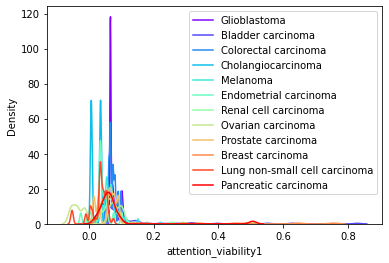

In [711]:
from matplotlib.pyplot import cm
color = iter(cm.rainbow(np.linspace(0, 1, len(clinical_df_dic.keys()))))
for key in clinical_df_dic.keys():
    c = next(color)
    sns.kdeplot(clinical_df_dic[key].attention_viability1, label=key,c=c)
plt.legend()
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Attention1_by_CancerType.pdf')

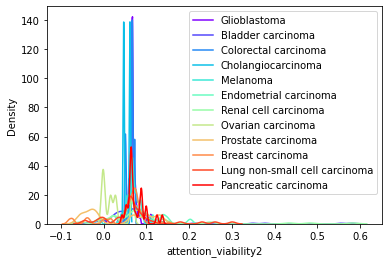

In [710]:
from matplotlib.pyplot import cm
color = iter(cm.rainbow(np.linspace(0, 1, len(clinical_df_dic.keys()))))
for key in clinical_df_dic.keys():
    c = next(color)
    sns.kdeplot(clinical_df_dic[key].attention_viability2, label=key,c=c)
plt.legend()
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Attention2_by_CancerType.pdf')

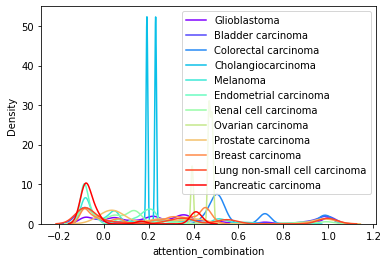

In [709]:
from matplotlib.pyplot import cm
color = iter(cm.rainbow(np.linspace(0, 1, len(clinical_df_dic.keys()))))
for key in clinical_df_dic.keys():
    c = next(color)
    sns.kdeplot(clinical_df_dic[key].attention_combination, label=key,c=c)
plt.legend()
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Attention_combination_by_CancerType.pdf')

In [714]:
print('----------------large ratio----------------')
for key in clinical_df_dic.keys():
    ratio_strong_comb=len(clinical_df_dic[key][clinical_df_dic[key].attention_combination>0.5])/len(clinical_df_dic[key])
    print(key+': '+str(ratio_strong_comb))
print('----------------mean----------------')
for key in clinical_df_dic.keys():
    mean_comb=clinical_df_dic[key].attention_combination.mean()
    print(key+': '+str(mean_comb))
print('----------------benefit----------------')
for key in clinical_df_dic.keys():
    mean_benefit=clinical_df_dic[key].benefit_by_combination.mean()
    print(key+': '+str(mean_benefit))


----------------large ratio----------------
Glioblastoma: 0.1929681667006041
Bladder carcinoma: 0.2750236832838175
Colorectal carcinoma: 0.6667162624609433
Cholangiocarcinoma: 0.0
Melanoma: 0.14024206572429185
Endometrial carcinoma: 0.0
Renal cell carcinoma: 0.09999503943647998
Ovarian carcinoma: 0.0
Prostate carcinoma: 0.16681552049221
Breast carcinoma: 0.0
Lung non-small cell carcinoma: 0.2750457541625128
Pancreatic carcinoma: 0.0
----------------mean----------------
Glioblastoma: 0.3055831
Bladder carcinoma: 0.3163078
Colorectal carcinoma: 0.6168593
Cholangiocarcinoma: 0.2121636
Melanoma: 0.13180938
Endometrial carcinoma: 0.044350974
Renal cell carcinoma: 0.14587805
Ovarian carcinoma: 0.45912516
Prostate carcinoma: 0.29092225
Breast carcinoma: 0.21518531
Lung non-small cell carcinoma: 0.25406528
Pancreatic carcinoma: 0.035521954
----------------benefit----------------
Glioblastoma: 0.016902692203206393
Bladder carcinoma: 0.09270383425023201
Colorectal carcinoma: 0.0444738911147879
C

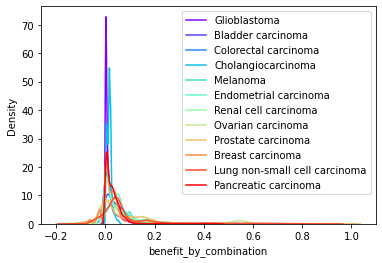

In [680]:
from matplotlib.pyplot import cm
color = iter(cm.rainbow(np.linspace(0, 1, len(clinical_df_dic.keys()))))
for key in clinical_df_dic.keys():
    c = next(color)
    sns.kdeplot(clinical_df_dic[key].benefit_by_combination, label=key,c=c)
plt.legend()
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Benefit_by_combination_CancerType.pdf')

In [670]:
drug_list=list(drug_df.index)
drug_type=['Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Hormone therapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Non-Chemotherapy','Chemotherapy','Hormone therapy','Targeted therapy','Hormone therapy','Targeted therapy','Chemotherapy','Non-Chemotherapy','Targeted therapy','Targeted therapy','Chemotherapy','Chemotherapy','Chemotherapy','Chemotherapy','Targeted therapy','Chemotherapy','Chemotherapy','Non-Chemotherapy','Immunotherapy','Chemotherapy']
drug_annotation_df=pd.DataFrame({'Drug':drug_list,'Type':drug_type})

In [671]:
drug_annotation_df_1=drug_annotation_df.copy()
drug_annotation_df_1.columns=['Drug1','Type1']
drug_annotation_df_2=drug_annotation_df.copy()
drug_annotation_df_2.columns=['Drug2','Type2']

In [672]:
clinical_df_sampled_predicted_with_annotation=pd.merge(clinical_df_sampled_predicted,drug_annotation_df_1,how='left',on='Drug1')
clinical_df_sampled_predicted_with_annotation=pd.merge(clinical_df_sampled_predicted_with_annotation,drug_annotation_df_2,how='left',on='Drug2')

In [673]:
not_chemo_only=clinical_df_sampled_predicted_with_annotation[(clinical_df_sampled_predicted_with_annotation.Type1!='Chemotherapy')|(clinical_df_sampled_predicted_with_annotation.Type2!='Chemotherapy')]

In [674]:
chemo_only=clinical_df_sampled_predicted_with_annotation[(clinical_df_sampled_predicted_with_annotation.Type1=='Chemotherapy')&(clinical_df_sampled_predicted_with_annotation.Type2=='Chemotherapy')]

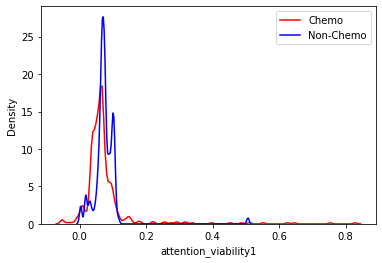

In [675]:
sns.kdeplot(chemo_only.attention_viability1,c='r',label='Chemo')
sns.kdeplot(not_chemo_only.attention_viability1,c='b',label='Non-Chemo')
plt.legend()

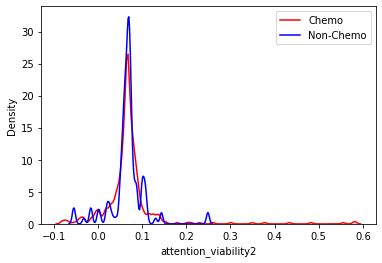

In [676]:
sns.kdeplot(chemo_only.attention_viability2,c='r',label='Chemo')
sns.kdeplot(not_chemo_only.attention_viability2,c='b',label='Non-Chemo')
plt.legend()

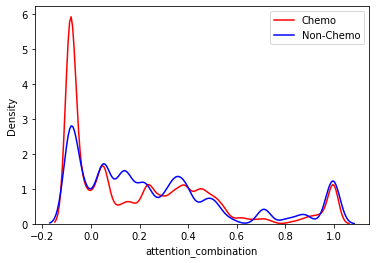

In [679]:
sns.kdeplot(chemo_only.attention_combination,c='r',label='Chemo')
sns.kdeplot(not_chemo_only.attention_combination,c='b',label='Non-Chemo')
plt.legend()
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Attention_combination_Chemo_vs_Not_Chemo.pdf')

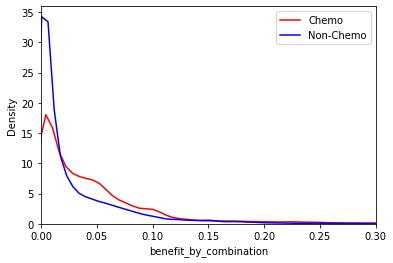

In [678]:
sns.kdeplot(chemo_only.benefit_by_combination,c='r',label='Chemo')
sns.kdeplot(not_chemo_only.benefit_by_combination,c='b',label='Non-Chemo')
plt.legend()
plt.xlim(0,0.3)
plt.savefig('/DAS_Storage4/ijjin/Study_2/Clinical/221125_Benefit_by_combination_Chemo_vs_Not_Chemo.pdf')

In [645]:
import scipy
scipy.stats.ttest_ind(chemo_only.benefit_by_combination,not_chemo_only.benefit_by_combination,alternative='two-sided',equal_var=False)

Ttest_indResult(statistic=244.42766855204525, pvalue=0.0)

In [716]:
chemo_only

,Drug1,Drug2,CancerType,CellName,CONC1,CONC2,PERCENTGROWTH,predicted_viability,viability1,viability2,min_viability,attention_viability1,attention_viability2,attention_combination,benefit_by_combination,Type1,Type2
0,Methotrexate,Vinblastine,Bladder carcinoma,HS172T,0.6,0.5,None,0.504143,1.582157,0.880090,0.880090,0.313736,0.030132,0.451141,0.375947,Chemotherapy,Chemotherapy
1,Cisplatin,Gemcitabine,Bladder carcinoma,UMUC3,0.1,0.0,None,1.421010,1.902922,1.523343,1.523343,0.145502,0.088008,0.999698,0.102333,Chemotherapy,Chemotherapy
2,Carboplatin,Gemcitabine,Bladder carcinoma,SW780,1.3,-0.1,None,1.806211,1.822680,1.947611,1.822680,0.050329,-0.015367,0.898864,0.016469,Chemotherapy,Chemotherapy
3,Cisplatin,Pemetrexed,Lung non-small cell carcinoma,NCIH1915,-1.1,0.7,None,1.197870,1.986940,1.255000,1.255000,0.054097,0.062676,0.999999,0.057130,Chemotherapy,Chemotherapy
7,Cisplatin,Gemcitabine,Bladder carcinoma,BFTC905,1.2,0.6,None,1.294049,1.460993,1.615473,1.460993,0.099354,0.066941,0.422898,0.166944,Chemotherapy,Chemotherapy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1080309,Doxorubicin,Fluorouracil,Breast carcinoma,HS274T,-1.7,1.5,None,1.743802,1.984679,1.762611,1.762611,0.088448,0.068555,0.324389,0.018809,Chemotherapy,Chemotherapy
1080312,Carboplatin,Docetaxel,Endometrial carcinoma,HEC251,1.4,0.2,None,1.207162,1.522023,1.253728,1.253728,0.036312,0.061691,-0.047178,0.046566,Chemotherapy,Chemotherapy
1080314,Cyclophosphamide,Fluorouracil,Breast carcinoma,EFM192A,-0.1,1.4,None,1.335241,1.991253,1.379282,1.379282,0.065667,0.070490,-0.052783,0.044042,Chemotherapy,Chemotherapy
1080317,Cisplatin,Docetaxel,Lung non-small cell carcinoma,HCC2429,1.9,1.5,None,0.908904,0.767600,1.311367,0.767600,-0.054283,-0.001950,-0.086091,-0.141304,Chemotherapy,Chemotherapy


In [718]:
not_chemo_only

,Drug1,Drug2,CancerType,CellName,CONC1,CONC2,PERCENTGROWTH,predicted_viability,viability1,viability2,min_viability,attention_viability1,attention_viability2,attention_combination,benefit_by_combination,Type1,Type2
4,Dexamethasone,Temozolomide,Glioblastoma,LN340,0.5,-1.0,None,1.967880,1.970275,1.994418,1.970275,0.066687,0.076472,-0.086091,0.002395,Non-Chemotherapy,Chemotherapy
5,Dexamethasone,Temozolomide,Glioblastoma,YH13,1.5,0.1,None,1.551312,1.585752,1.986932,1.585752,0.074334,0.062492,0.522997,0.034440,Non-Chemotherapy,Chemotherapy
6,Sorafenib,Sunitinib,Renal cell carcinoma,VMRCRCZ,-0.6,1.6,None,0.000000,1.989676,0.216563,0.216563,0.052935,0.249053,-0.086091,0.216563,Targeted therapy,Targeted therapy
13,Erlotinib,Temozolomide,Glioblastoma,42MGBA,-1.9,-0.7,None,1.990192,1.991567,1.993101,1.991567,0.100400,0.069394,0.845206,0.001375,Targeted therapy,Chemotherapy
21,Erlotinib,Temozolomide,Glioblastoma,LN340,1.8,-1.6,None,1.314519,1.376017,1.995095,1.376017,0.098940,0.005064,-0.086091,0.061498,Targeted therapy,Chemotherapy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1080311,Sorafenib,Sunitinib,Renal cell carcinoma,TUHR4TKB,-0.3,0.5,None,1.673713,1.989367,1.703381,1.703381,0.019250,0.100244,-0.086091,0.029668,Targeted therapy,Targeted therapy
1080313,Dexamethasone,Temozolomide,Glioblastoma,SNU626,0.6,0.1,None,1.903637,1.912563,1.976349,1.912563,0.086093,0.058918,0.002734,0.008927,Non-Chemotherapy,Chemotherapy
1080315,Dexamethasone,Temozolomide,Glioblastoma,GAMG,-0.7,0.4,None,1.942652,1.990349,1.946841,1.946841,0.071903,0.058956,0.705256,0.004190,Non-Chemotherapy,Chemotherapy
1080316,Erlotinib,Temozolomide,Glioblastoma,KNS42,-1.7,2.0,None,1.032088,1.989576,1.085475,1.085475,0.078822,0.057773,-0.028291,0.053387,Targeted therapy,Chemotherapy
